In [1]:
import pandas as pd
pd.set_option("display.max_rows", None)
pd.set_option('display.max_colwidth', None)
#import os
#import re
import matplotlib.pyplot as plt
#import pickle
from IPython.display import display, Markdown

#import dbmsbenchmarker
#import bexhoma
from bexhoma import evaluators

%matplotlib inline

In [2]:
cut_at = 0
def plot_measures(metric, smoothing=0):
    display(Markdown(f'# Metric {metric}'))
    list_configurations = list(df_benchmarks['configuration'].unique())    
    for configuration in list_configurations:
        display(Markdown(f'## Configuration {configuration}'))
        list_experiment_runs = sorted(list(df_benchmarks[df_benchmarks['configuration'] == configuration]['experiment_run'].unique()))
        for experiment_run in list_experiment_runs:
            display(Markdown(f'### Experiment run {experiment_run}'))
            list_runs = sorted(list(df_benchmarks[df_benchmarks['configuration'] == configuration][df_benchmarks['experiment_run'] == experiment_run]['client'].unique()))
            #list_targets = sorted(list(df_benchmarks[df_benchmarks['configuration'] == configuration][df_benchmarks['experiment_run'] == experiment_run]['target'].unique()))
            num_runs = len(list_runs)
            # Create a 2-column grid layout
            n_cols = 2
            n_rows = num_runs
            fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 5 * n_rows), sharex=True)
            # Flatten axes for easy iteration (handles cases with n_rows == 1 or n_cols == 1)
            axes = axes.flatten()
            i = 0
            for client in list_runs:
                #################################
                # show plots with aggregated line
                #################################
                # filter data for this run
                df_part = df_benchmarks[df_benchmarks['configuration'] == configuration]
                df_part = df_part[df_part['experiment_run'] == (experiment_run)]
                df_part = df_part[df_part['client'] == (client)]
                df_total = evaluation.get_benchmark_logs_timeseries_df_aggregated(metric=metric, configuration=configuration, client=client, experiment_run=experiment_run)
                threads = df_part['threads'].sum()
                pod_count = df_part['pod_count'].mean()
                target = df_part['target'].sum()
                # Compute the time spans
                time_spans = df_total.index.to_series().diff().shift(-1).fillna(0)  # Difference between consecutive time indices
                # Weighted average: Multiply each value by its duration and sum
                weighted_sum = (df_total[metric].multiply(time_spans, axis=0)).sum().sum()  # Multiply each value by its time span, sum all values
                total_time = time_spans.sum()  # Total time span
                # Compute the weighted average
                weighted_average = weighted_sum / total_time
                df_total['avg'] = weighted_average
                df_total = df_total.rename(columns={'avg': f'avg={weighted_average}'})
                #df_total = df_total.fillna(0)
                # optionally smoothen graph
                if smoothing > 0:
                    df_total[metric] = df_total[metric].rolling(window=smoothing, min_periods=1).mean()
                # optionally leave out data at the end (cool down)
                if cut_at > 0:
                    df_total = df_total[:-cut_at]
                # generate plot
                title = "{}/{} threads - target = {}".format(threads, int(pod_count), target)
                ax = axes[i]
                i = i + 1
                max_value = df_total[metric].max()
                df_total.plot(title=title, ax=ax, ylim=(0,max_value*1.1), use_index=True)
                last_x = df_total.index[-1] # Get the last datapoint's x-coordinate (the last index)
                ax.axvline(x=last_x, color='red', linestyle='--', label='Last Datapoint') # Add a vertical line at the last datapoint
                ###############################
                # show plots with lines per pod
                ###############################
                df_list = evaluation.get_benchmark_logs_timeseries_df_single(metric=metric, configuration=configuration, client=client, experiment_run=experiment_run)
                # collect in one dataframe
                df_total = pd.DataFrame()
                j=1
                max_value = 0
                for df in df_list:
                    # optionally leave out data at the end (cool down)
                    if cut_at > 0:
                        df_tmp = df[metric][:-cut_at]
                    else:
                        df_tmp = df[metric]
                    df_single = pd.DataFrame(df_tmp)
                    if max_value < df_single[metric].max():
                        max_value = df_single[metric].max()
                    df_single.columns=["pod "+str(j)]
                    df_total = pd.merge(df_total, df_single, how='outer', left_index=True, right_index=True)
                    j = j + 1
                #print(df_combined)
                # Compute the time spans
                time_spans = df_total.index.to_series().diff().shift(-1).fillna(0)  # Difference between consecutive time indices
                weighted_sum = (df_total.multiply(time_spans, axis=0)).sum().sum()  # Multiply each value by its time span, sum all values
                total_time = time_spans.sum()  # Total time span
                # Compute the weighted average
                weighted_average = weighted_sum / total_time / len(df_list)
                df_total['avg'] = weighted_average
                df_total = df_total.rename(columns={'avg': f'avg={weighted_average}'})
                #df_total = df_total.fillna(0)
                # optionally smoothen graph
                if smoothing > 0:
                    df_total = df_total.rolling(window=smoothing, min_periods=1).mean()
                # generate plot
                title = "{}/{} threads - target = {}".format(threads, int(pod_count), target)
                ax = axes[i]
                i = i + 1
                df_total.plot(title=title, ax=ax, ylim=(0,max_value*1.1), use_index=True, legend=False)
                last_x = df_total.index[-1] # Get the last datapoint's x-coordinate (the last index)
                ax.axvline(x=last_x, color='red', linestyle='--', label='Last Datapoint') # Add a vertical line at the last datapoint
            # Hide any unused subplots
            for j in range(num_runs*2, len(axes)):
                fig.delaxes(axes[j])
            plt.tight_layout()
            plt.show()


In [3]:
code = "1737453595"
path = "D:\\data\\benchmarks-250126"
evaluation = evaluators.ycsb(code=code, path=path)

In [4]:
df_benchmarks = evaluation.get_df_benchmarking()
#df = df[df.columns.drop(list(df.filter(regex='FAILED')))]
df_benchmarks = evaluation.benchmarking_set_datatypes(df_benchmarks)
df_benchmarks.T

connection_pod,PostgreSQL-64-8-196608-40-1,PostgreSQL-64-8-196608-30-1,PostgreSQL-64-8-196608-16-1,PostgreSQL-64-8-196608-44-1,PostgreSQL-64-8-196608-46-1,PostgreSQL-64-8-196608-38-1,PostgreSQL-64-8-196608-45-1,PostgreSQL-64-8-196608-42-1,PostgreSQL-64-8-196608-6-1,PostgreSQL-64-8-196608-28-1,...,PostgreSQL-64-8-196608-24-8,PostgreSQL-64-8-196608-46-8,PostgreSQL-64-8-196608-44-8,PostgreSQL-64-8-196608-6-8,PostgreSQL-64-8-196608-26-8,PostgreSQL-64-8-196608-4-8,PostgreSQL-64-8-196608-14-8,PostgreSQL-64-8-196608-12-8,PostgreSQL-64-8-196608-34-8,PostgreSQL-64-8-196608-42-8
connection,PostgreSQL-64-8-196608-40,PostgreSQL-64-8-196608-30,PostgreSQL-64-8-196608-16,PostgreSQL-64-8-196608-44,PostgreSQL-64-8-196608-46,PostgreSQL-64-8-196608-38,PostgreSQL-64-8-196608-45,PostgreSQL-64-8-196608-42,PostgreSQL-64-8-196608-6,PostgreSQL-64-8-196608-28,...,PostgreSQL-64-8-196608-24,PostgreSQL-64-8-196608-46,PostgreSQL-64-8-196608-44,PostgreSQL-64-8-196608-6,PostgreSQL-64-8-196608-26,PostgreSQL-64-8-196608-4,PostgreSQL-64-8-196608-14,PostgreSQL-64-8-196608-12,PostgreSQL-64-8-196608-34,PostgreSQL-64-8-196608-42
configuration,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,...,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608,PostgreSQL-64-8-196608
experiment_run,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
client,40,30,16,44,46,38,45,42,6,28,...,24,46,44,6,26,4,14,12,34,42
pod,4099sgz.dbmsbenchmarker,30vqvdw.dbmsbenchmarker,16jfr5n.dbmsbenchmarker,44fkcc2.dbmsbenchmarker,46nnc9k.dbmsbenchmarker,384v9nj.dbmsbenchmarker,459cq9l.dbmsbenchmarker,42lrkbf.dbmsbenchmarker,kqd2k.dbmsbenchmarker,28grn4v.dbmsbenchmarker,...,24tgd7g.dbmsbenchmarker,469q67p.dbmsbenchmarker,44stk2s.dbmsbenchmarker,sdf8t.dbmsbenchmarker,26kcr4z.dbmsbenchmarker,gvspc.dbmsbenchmarker,14549z6.dbmsbenchmarker,126jdbx.dbmsbenchmarker,34mpgcg.dbmsbenchmarker,42wxgk6.dbmsbenchmarker
pod_count,8,8,8,8,8,8,1,8,8,8,...,8,8,8,8,8,8,8,8,8,8
threads,17,17,15,14,15,16,120,13,15,16,...,14,15,14,15,15,14,14,13,14,13
target,26624,24576,22528,28672,28672,26624,229376,28672,20480,24576,...,24576,28672,28672,20480,24576,20480,22528,22528,26624,28672
sf,16,16,16,16,16,16,16,16,16,16,...,16,16,16,16,16,16,16,16,16,16
workload,c,c,c,c,c,c,c,c,c,c,...,c,c,c,c,c,c,c,c,c,c


# Metric current_ops_per_sec

## Configuration PostgreSQL-64-8-196608

### Experiment run 1

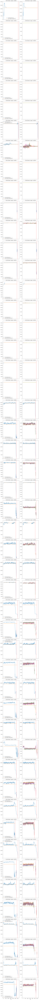

In [5]:
metric = 'current_ops_per_sec'
plot_measures(metric, smoothing=0)

# Metric READ_Avg

## Configuration PostgreSQL-64-8-196608

### Experiment run 1

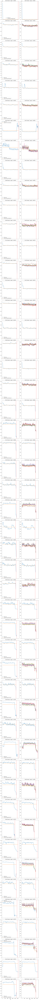

In [6]:
metric = 'READ_Avg'
plot_measures(metric, smoothing=5)

# Metric READ_99.9

## Configuration PostgreSQL-64-8-196608

### Experiment run 1

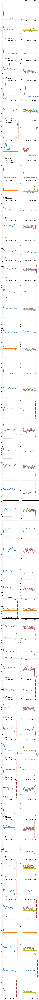

In [7]:
metric = 'READ_99.9'
plot_measures(metric, smoothing=5)

# Metric UPDATE_99.9

## Configuration PostgreSQL-64-8-196608

### Experiment run 1

KeyError: 'UPDATE_99.9'

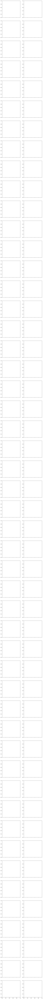

In [8]:
metric = 'UPDATE_99.9'
plot_measures(metric, smoothing=5)